# Traffic Flow Prediction for Smart Cities

Objective: Predict traffic flow patterns for optimal transportation.

## Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Read Data

In [2]:
data=pd.read_csv('Metro_Interstate_Traffic_Volume.csv.gz')

In [3]:
data.head()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
0,None,288.28,0.0,0.0,40,Clouds,scattered clouds,2012-10-02 09:00:00,5545
1,None,289.36,0.0,0.0,75,Clouds,broken clouds,2012-10-02 10:00:00,4516
2,None,289.58,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 11:00:00,4767
3,None,290.13,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 12:00:00,5026
4,None,291.14,0.0,0.0,75,Clouds,broken clouds,2012-10-02 13:00:00,4918


## Check the info() of the data

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48204 entries, 0 to 48203
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   holiday              48204 non-null  object 
 1   temp                 48204 non-null  float64
 2   rain_1h              48204 non-null  float64
 3   snow_1h              48204 non-null  float64
 4   clouds_all           48204 non-null  int64  
 5   weather_main         48204 non-null  object 
 6   weather_description  48204 non-null  object 
 7   date_time            48204 non-null  object 
 8   traffic_volume       48204 non-null  int64  
dtypes: float64(3), int64(2), object(4)
memory usage: 3.3+ MB


## Statistical Information about data set

In [5]:
data.describe()

,temp,rain_1h,snow_1h,clouds_all,traffic_volume
count,48204.000000,48204.000000,48204.000000,48204.000000,48204.000000
mean,281.205870,0.334264,0.000222,49.362231,3259.818355
std,13.338232,44.789133,0.008168,39.015750,1986.860670
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,272.160000,0.000000,0.000000,1.000000,1193.000000
50%,282.450000,0.000000,0.000000,64.000000,3380.000000
75%,291.806000,0.000000,0.000000,90.000000,4933.000000
max,310.070000,9831.300000,0.510000,100.000000,7280.000000


## Check Null values

In [6]:
data.isna().sum()

holiday                0
temp                   0
rain_1h                0
snow_1h                0
clouds_all             0
weather_main           0
weather_description    0
date_time              0
traffic_volume         0
dtype: int64

In [7]:
data['traffic_volume']

0        5545
1        4516
2        4767
3        5026
4        4918
         ... 
48199    3543
48200    2781
48201    2159
48202    1450
48203     954
Name: traffic_volume, Length: 48204, dtype: int64

## view the categorical columns

In [8]:
data.head()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
0,None,288.28,0.0,0.0,40,Clouds,scattered clouds,2012-10-02 09:00:00,5545
1,None,289.36,0.0,0.0,75,Clouds,broken clouds,2012-10-02 10:00:00,4516
2,None,289.58,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 11:00:00,4767
3,None,290.13,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 12:00:00,5026
4,None,291.14,0.0,0.0,75,Clouds,broken clouds,2012-10-02 13:00:00,4918


In [9]:
data['holiday'].unique()

array(['None', 'Columbus Day', 'Veterans Day', 'Thanksgiving Day',
       'Christmas Day', 'New Years Day', 'Washingtons Birthday',
       'Memorial Day', 'Independence Day', 'State Fair', 'Labor Day',
       'Martin Luther King Jr Day'], dtype=object)

In [10]:
data['weather_main'].unique()

array(['Clouds', 'Clear', 'Rain', 'Drizzle', 'Mist', 'Haze', 'Fog',
       'Thunderstorm', 'Snow', 'Squall', 'Smoke'], dtype=object)

In [11]:
data['weather_description'].unique()

array(['scattered clouds', 'broken clouds', 'overcast clouds',
       'sky is clear', 'few clouds', 'light rain',
       'light intensity drizzle', 'mist', 'haze', 'fog',
       'proximity shower rain', 'drizzle', 'moderate rain',
       'heavy intensity rain', 'proximity thunderstorm',
       'thunderstorm with light rain', 'proximity thunderstorm with rain',
       'heavy snow', 'heavy intensity drizzle', 'snow',
       'thunderstorm with heavy rain', 'freezing rain', 'shower snow',
       'light rain and snow', 'light intensity shower rain', 'SQUALLS',
       'thunderstorm with rain', 'proximity thunderstorm with drizzle',
       'thunderstorm', 'Sky is Clear', 'very heavy rain',
       'thunderstorm with light drizzle', 'light snow',
       'thunderstorm with drizzle', 'smoke', 'shower drizzle',
       'light shower snow', 'sleet'], dtype=object)

## convert categorical value to Nuemerical

In [12]:
new_data=pd.get_dummies(data,drop_first=True)

In [13]:
pd.set_option('display.max_columns',None)

In [14]:
new_data.head()

,temp,rain_1h,snow_1h,clouds_all,traffic_volume,holiday_Columbus Day,holiday_Independence Day,holiday_Labor Day,holiday_Martin Luther King Jr Day,holiday_Memorial Day,holiday_New Years Day,holiday_None,holiday_State Fair,holiday_Thanksgiving Day,holiday_Veterans Day,holiday_Washingtons Birthday,weather_main_Clouds,weather_main_Drizzle,weather_main_Fog,weather_main_Haze,weather_main_Mist,weather_main_Rain,weather_main_Smoke,weather_main_Snow,weather_main_Squall,weather_main_Thunderstorm,weather_description_Sky is Clear,weather_description_broken clouds,weather_description_drizzle,weather_description_few clouds,weather_description_fog,weather_description_freezing rain,weather_description_haze,weather_description_heavy intensity drizzle,weather_description_heavy intensity rain,weather_description_heavy snow,weather_description_light intensity drizzle,weather_description_light intensity shower rain,weather_description_light rain,weather_description_light rain and snow,weather_description_light shower snow,weather_description_light snow,weather_description_mist,weather_description_moderate rain,weather_description_overcast clouds,weather_description_proximity shower rain,weather_description_proximity thunderstorm,weather_description_proximity thunderstorm with drizzle,weather_description_proximity thunderstorm with rain,weather_description_scattered clouds,weather_description_shower drizzle,weather_description_shower snow,weather_description_sky is clear,weather_description_sleet,weather_description_smoke,weather_description_snow,weather_description_thunderstorm,weather_description_thunderstorm with drizzle,weather_description_thunderstorm with heavy rain,weather_description_thunderstorm with light drizzle,weather_description_thunderstorm with light rain,weather_description_thunderstorm with rain,weather_description_very heavy rain,date_time_2012-10-02 10:00:00,date_time_2012-10-02 11:00:00,date_time_2012-10-02 12:00:00,date_time_2012-10-02 13:00:00,date_time_2012-10-02 14:00:00,date_time_2012-10-02 15:00:00,date_time_2012-10-02 16:00:00,date_time_2012-10-02 17:00:00,date_time_2012-10-02 18:00:00,date_time_2012-10-02 19:00:00,date_time_2012-10-02 20:00:00,date_time_2012-10-02 21:00:00,date_time_2012-10-02 22:00:00,date_time_2012-10-02 23:00:00,date_time_2012-10-03 00:00:00,date_time_2012-10-03 01:00:00,date_time_2012-10-03 02:00:00,date_time_2012-10-03 03:00:00,date_time_2012-10-03 04:00:00,date_time_2012-10-03 05:00:00,date_time_2012-10-03 06:00:00,date_time_2012-10-03 08:00:00,date_time_2012-10-03 09:00:00,date_time_2012-10-03 12:00:00,date_time_2012-10-03 13:00:00,date_time_2012-10-03 14:00:00,date_time_2012-10-03 15:00:00,date_time_2012-10-03 16:00:00,date_time_2012-10-03 18:00:00,date_time_2012-10-03 19:00:00,date_time_2012-10-03 20:00:00,date_time_2012-10-03 21:00:00,date_time_2012-10-03 22:00:00,date_time_2012-10-03 23:00:00,date_time_2012-10-04 00:00:00,date_time_2012-10-04 01:00:00,date_time_2012-10-04 02:00:00,date_time_2012-10-04 03:00:00,date_time_2012-10-04 04:00:00,date_time_2012-10-04 05:00:00,date_time_2012-10-04 06:00:00,date_time_2012-10-04 07:00:00,date_time_2012-10-04 08:00:00,date_time_2012-10-04 09:00:00,date_time_2012-10-04 10:00:00,date_time_2012-10-04 11:00:00,date_time_2012-10-04 12:00:00,date_time_2012-10-04 13:00:00,date_time_2012-10-04 14:00:00,date_time_2012-10-04 15:00:00,date_time_2012-10-04 16:00:00,date_time_2012-10-04 17:00:00,date_time_2012-10-04 18:00:00,date_time_2012-10-04 19:00:00,date_time_2012-10-04 20:00:00,date_time_2012-10-04 21:00:00,date_time_2012-10-04 22:00:00,date_time_2012-10-04 23:00:00,date_time_2012-10-05 00:00:00,date_time_2012-10-05 01:00:00,date_time_2012-10-05 03:00:00,date_time_2012-10-05 05:00:00,date_time_2012-10-05 06:00:00,date_time_2012-10-05 07:00:00,date_time_2012-10-05 08:00:00,date_time_2012-10-05 09:00:00,date_time_2012-10-05 10:00:00,date_time_2012-10-05 11:00:00,date_time_2012-10-05 12:00:00,date_time_2012-10-05 13:00:00,date_time_2012-10-05 14:00:00,date_time_2

# Feature Engineering:

## Convert 'date_time' column to datetime format

In [15]:
data['date_time'] = pd.to_datetime(data['date_time'])

In [16]:
data.head()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
0,None,288.28,0.0,0.0,40,Clouds,scattered clouds,2012-10-02 09:00:00,5545
1,None,289.36,0.0,0.0,75,Clouds,broken clouds,2012-10-02 10:00:00,4516
2,None,289.58,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 11:00:00,4767
3,None,290.13,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 12:00:00,5026
4,None,291.14,0.0,0.0,75,Clouds,broken clouds,2012-10-02 13:00:00,4918


In [17]:
data['date'] = data['date_time'].dt.date

### Extract time

In [18]:
data['time'] = data['date_time'].dt.time 

### Extract day name

In [19]:
data['day'] = data['date_time'].dt.day_name()

In [20]:
data.head()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume,date,time,day
0,None,288.28,0.0,0.0,40,Clouds,scattered clouds,2012-10-02 09:00:00,5545,2012-10-02,09:00:00,Tuesday
1,None,289.36,0.0,0.0,75,Clouds,broken clouds,2012-10-02 10:00:00,4516,2012-10-02,10:00:00,Tuesday
2,None,289.58,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 11:00:00,4767,2012-10-02,11:00:00,Tuesday
3,None,290.13,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 12:00:00,5026,2012-10-02,12:00:00,Tuesday
4,None,291.14,0.0,0.0,75,Clouds,broken clouds,2012-10-02 13:00:00,4918,2012-10-02,13:00:00,Tuesday


In [21]:
relevant_features = data[['time', 'day', 'weather_main', 'weather_description', 'traffic_volume']]
print(relevant_features.head())

       time      day weather_main weather_description  traffic_volume
0  09:00:00  Tuesday       Clouds    scattered clouds            5545
1  10:00:00  Tuesday       Clouds       broken clouds            4516
2  11:00:00  Tuesday       Clouds     overcast clouds            4767
3  12:00:00  Tuesday       Clouds     overcast clouds            5026
4  13:00:00  Tuesday       Clouds       broken clouds            4918


## Create lag features for traffic_volume

In [22]:
num_lags=3
for i in range(1, num_lags + 1):
    data[f'traffic_volume_lag_{i}'] = data['traffic_volume'].shift(i)
    print(data.head(num_lags + 1))

  holiday    temp  rain_1h  snow_1h  clouds_all weather_main  \
0    None  288.28      0.0      0.0          40       Clouds   
1    None  289.36      0.0      0.0          75       Clouds   
2    None  289.58      0.0      0.0          90       Clouds   
3    None  290.13      0.0      0.0          90       Clouds   

  weather_description           date_time  traffic_volume        date  \
0    scattered clouds 2012-10-02 09:00:00            5545  2012-10-02   
1       broken clouds 2012-10-02 10:00:00            4516  2012-10-02   
2     overcast clouds 2012-10-02 11:00:00            4767  2012-10-02   
3     overcast clouds 2012-10-02 12:00:00            5026  2012-10-02   

       time      day  traffic_volume_lag_1  
0  09:00:00  Tuesday                   NaN  
1  10:00:00  Tuesday                5545.0  
2  11:00:00  Tuesday                4516.0  
3  12:00:00  Tuesday                4767.0  
  holiday    temp  rain_1h  snow_1h  clouds_all weather_main  \
0    None  288.28      0

## Data Visualization

CountPlot

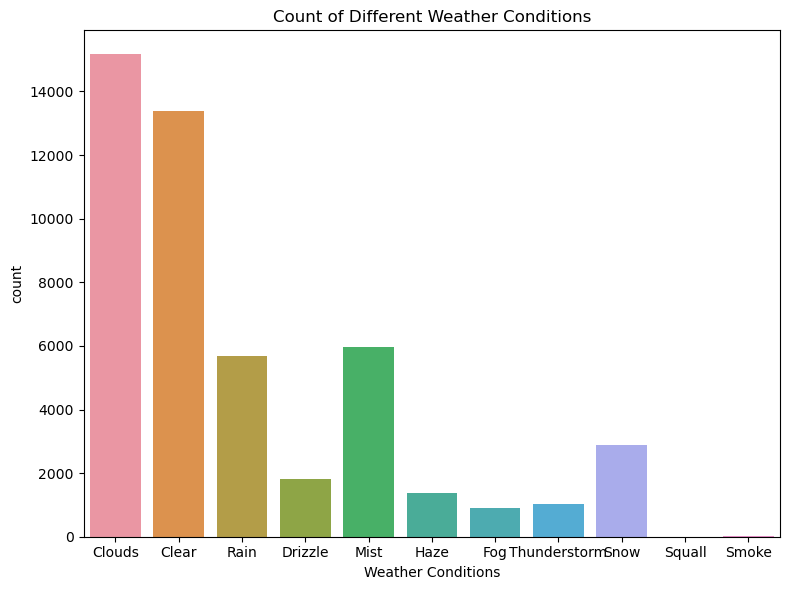

In [25]:
plt.figure(figsize=(8,6))
sns.countplot(x=data['weather_main'])
plt.title('Count of Different Weather Conditions')
plt.xlabel('Weather Conditions')
plt.xlabel('Weather Conditions')
plt.tight_layout()
plt.show()

Lineplot

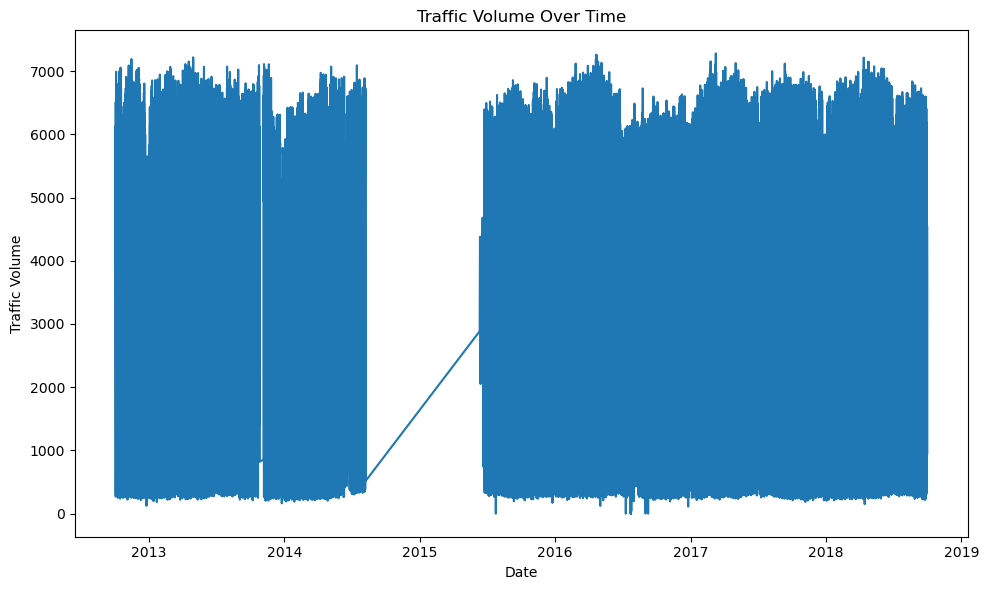

In [24]:
plt.figure(figsize=(10, 6))
sns.lineplot(x=data['date_time'], y=data['traffic_volume'])
plt.title('Traffic Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Traffic Volume')
plt.tight_layout()
plt.show()

Barplot

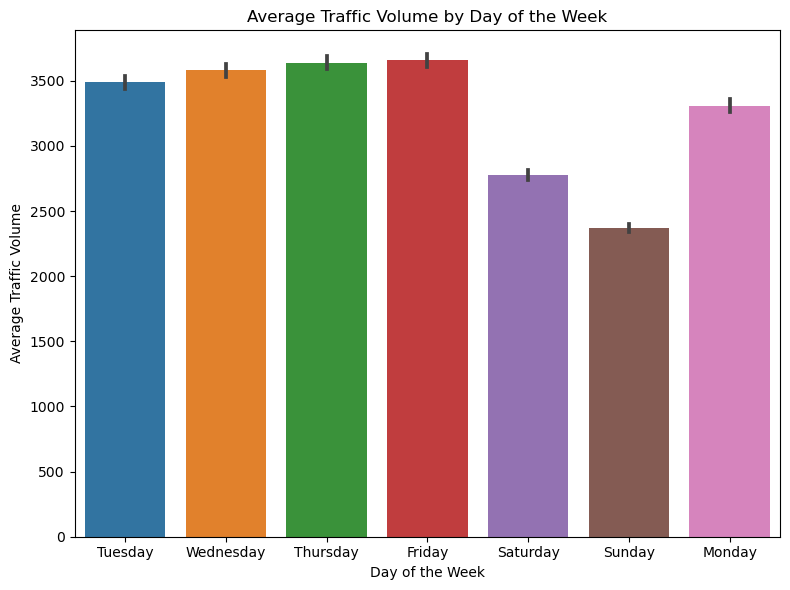

In [26]:
plt.figure(figsize=(8, 6))
sns.barplot(x='day', y='traffic_volume', data=data)
plt.title('Average Traffic Volume by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Average Traffic Volume')
plt.tight_layout()
plt.show()

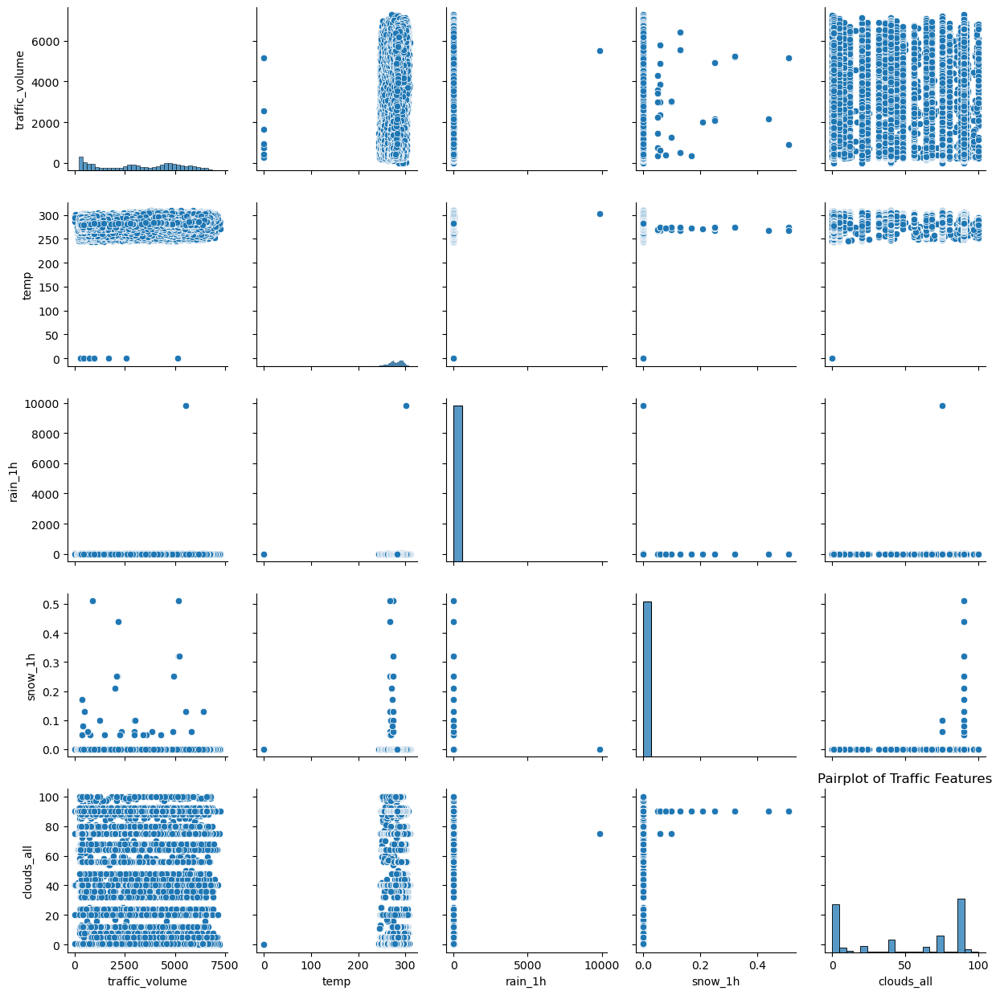

In [32]:
traffic_features = ['traffic_volume', 'weather_main', 'temp', 'rain_1h', 'snow_1h', 'clouds_all']
sns.pairplot(data[traffic_features])
plt.title('Pairplot of Traffic Features')
plt.tight_layout()
plt.show()